In [76]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neural_network import BernoulliRBM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score as r2, root_mean_squared_error as rmse
from sklearn.model_selection import train_test_split as tts

n_points = 1000
x = np.linspace(0, 10, n_points)
y = np.sin(x)

window_size = 10
scaler = MinMaxScaler()
y_normalized = scaler.fit_transform(y.reshape(-1, 1)).flatten()
X = np.array([y_normalized[i:i+window_size] for i in range(n_points - window_size)])

rbm = BernoulliRBM(n_components=100, learning_rate=0.005, n_iter=200)
rbm.fit(X)

BernoulliRBM(learning_rate=0.005, n_components=100, n_iter=200)

In [77]:
# костыль против бинарности бернулевской рбм
bool2continuous = np.mean([rbm.gibbs(X).astype(int) for _ in range(50)], axis=0)

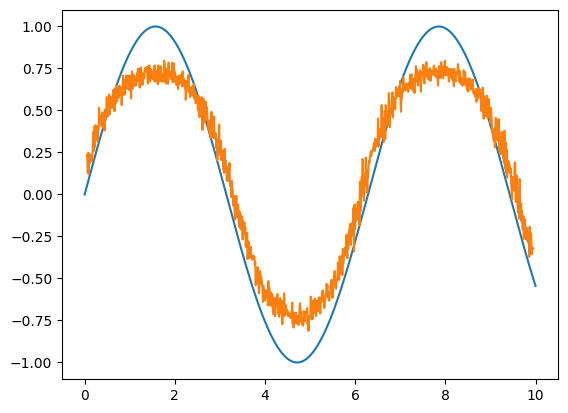

(0.9263536042849094, 0.18102506794928497)

In [ ]:
y_pred = scaler.inverse_transform(bool2continuous.mean(axis=1).reshape(1, -1))

plt.plot(x, y)
plt.plot(x[window_size//2: -window_size//2], y_pred.flatten())
plt.show()

r2(y[window_size//2:-window_size//2], y_pred.flatten()), rmse(y[window_size//2: -window_size//2], y_pred.flatten())

In [79]:
ratings = pd.read_csv("ratings_small.csv")
ratings['movieId'] = ratings['movieId'].astype(str)
movies = pd.read_csv("movies_metadata.csv")[["id", "title"]]
ratings = ratings[["userId", "movieId", "rating"]]
ratings.head()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3304\374311706.py:3: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  movies = pd.read_csv("movies_metadata.csv")[["id", "title"]]


,userId,movieId,rating
0,1,31,2.5
1,1,1029,3.0
2,1,1061,3.0
3,1,1129,2.0
4,1,1172,4.0


In [80]:
ratings_matrix = ratings.pivot(index="userId", columns="movieId", values="rating").fillna(0)
ratings_matrix

movieId,1,10,100,100017,100032,100034,100083,100106,100159,100163,...,99795,998,99811,99813,99839,99846,999,99912,99917,99992
userId,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
668,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
669,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
scaler = MinMaxScaler()
ratings_scaled = scaler.fit_transform(ratings_matrix)
atings_scaled = pd.DataFrame(ratings_scaled, columns=ratings_matrix.columns, index=ratings_matrix.index)
ratings_scaled

array([[0. , 0. , 0. , ..., 0. , 0. , 0. ],
       [0. , 0.8, 0. , ..., 0. , 0. , 0. ],
       [0. , 0. , 0. , ..., 0. , 0. , 0. ],
       ...,
       [0. , 0. , 0. , ..., 0. , 0. , 0. ],
       [0.8, 0. , 0. , ..., 0. , 0. , 0. ],
       [1. , 0. , 0. , ..., 0. , 0. , 0. ]])

In [82]:
rbm = BernoulliRBM(n_components=100, learning_rate=0.005, n_iter=100)
rbm.fit(ratings_scaled)

BernoulliRBM(learning_rate=0.005, n_components=100, n_iter=100)

In [83]:
# аналогичный костыль
meaned = sum(rbm.gibbs(ratings_scaled) for _ in range(50)) / 50

predicted_ratings = scaler.inverse_transform(meaned)
predicted_ratings = pd.DataFrame(predicted_ratings, columns=ratings_matrix.columns, index=ratings_matrix.index)
predicted_ratings.head()

movieId,1,10,100,100017,100032,100034,100083,100106,100159,100163,...,99795,998,99811,99813,99839,99846,999,99912,99917,99992
userId,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.1,0.1,0.0,0.0,0.0,0.00,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
2,0.0,0.1,0.1,0.0,0.0,0.0,0.05,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.00,0.0
3,0.4,0.1,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.05,...,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.00,0.0
4,0.8,0.7,0.1,0.0,0.0,0.0,0.05,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.0,0.04,0.0
5,0.7,0.3,0.2,0.0,0.0,0.0,0.00,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0


In [84]:
user_id = 1

user_ratings = predicted_ratings.loc[user_id]
watched_movies = ratings_matrix.loc[user_id][ratings_matrix.loc[user_id] > 0].index
user_ratings = user_ratings.drop(watched_movies)

top_movies = user_ratings.sort_values(ascending=False)
top_movies = pd.DataFrame(top_movies).reset_index()
top_movies = top_movies.merge(movies, how='inner', left_on="movieId", right_on="id")[["title", "movieId", user_id]]
top_movies


,title,movieId,1
0,Terminator 3: Rise of the Machines,296,1.0
1,Cockles and Muscles,349,0.9
2,Ocean's Eleven,161,0.8
3,Solaris,593,0.8
4,Back to the Future Part II,165,0.6
...,...,...,...
2820,Harold's Going Stiff,100272,0.0
2821,Trapped in the Closet: Chapters 1-12,100450,0.0
2822,"Sherlock, Jr.",992,0.0
2823,Straw Dogs,994,0.0


In [ ]:
train, test = tts(ratings_scaled, test_size=0.3)
rbm.fit(train)

pred = sum(rbm.gibbs(test) for _ in range(50)) / 50
pred = scaler.inverse_transform(pred)

rmse = rmse(scaler.inverse_transform(test), pred)
r2 = r2(scaler.inverse_transform(test), pred)

r2, rmse

(0.014119557855624305, 0.32861213465718303)

мой вывод: моделька не сильно подходит под решение поставленных задач, хоть и в первой точнность относительно высокая